In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/manga_images/dataset.zip /content/
!unzip -q /content/dataset.zip -d /content/manga_data/

In [ ]:
!pip install opencv-python-headless tqdm

In [ ]:
import os
import glob
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
BUFFER_SIZE=1000
BATCH_SIZE=16
IMG_WIDTH=256
IMG_HEIGHT=256

data_dir='/content/manga_data/manga_dataset/train/'
PATH_BW=os.path.join(data_dir,'bw')
PATH_COLOR=os.path.join(data_dir,'color')

bw_images_jpg = sorted(glob.glob(os.path.join(PATH_BW, "*.jpg")))
color_images_jpg = sorted(glob.glob(os.path.join(PATH_COLOR, "*.jpg")))
bw_images_png = sorted(glob.glob(os.path.join(PATH_BW, "*.png")))
color_images_png = sorted(glob.glob(os.path.join(PATH_COLOR, "*.png")))
bw_images = sorted(bw_images_jpg + bw_images_png)
color_images = sorted(color_images_jpg + color_images_png)

print(f"Found {len(bw_images)} black-and-white images.")
print(f"Found {len(color_images)} color images.")
if len(bw_images) == 0 or len(color_images) == 0:
    print("\n--- ERROR ---")
    print("Could not find images. Check your folder paths in `PATH_BW` and `PATH_COLOR`.")
elif len(bw_images) != len(color_images):
    print("\n--- ERROR ---")
    print("Mismatch between b/w and color images. Make sure every image has a pair.")
else:
    print("\nFile paths look good!")

Found 12136 black-and-white images.
Found 12136 color images.

File paths look good!


In [ ]:
def load_image(bw_path,color_path):
  bw_image = tf.io.read_file(bw_path)
  color_image = tf.io.read_file(color_path)
  bw_image_tensor= tf.image.decode_image(bw_image, channels=3)
  color_image_tensor= tf.image.decode_image(color_image, channels=3)
  bw_image_tensor.set_shape([None, None, 3])
  color_image_tensor.set_shape([None, None, 3])
  return bw_image_tensor,color_image_tensor

def resize_images(bw_image,color_image):
  bw_image = tf.image.resize(bw_image, [IMG_HEIGHT, IMG_WIDTH],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  color_image = tf.image.resize(color_image, [IMG_HEIGHT, IMG_WIDTH],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return bw_image, color_image

def normalize_images(bw_image,color_image):
  bw_image = (tf.cast(bw_image, tf.float32) / 127.5) - 1
  color_image = (tf.cast(color_image, tf.float32) / 127.5) - 1
  return bw_image, color_image

# This function will now only handle loading, resizing, and initial normalization
def load_and_resize_and_normalize(bw_path,color_path):
  bw_image, color_image = load_image(bw_path, color_path)
  bw_image, color_image = resize_images(bw_image, color_image)
  bw_image, color_image = normalize_images(bw_image, color_image)
  return bw_image, color_image

# This function will handle the LAB conversion and channel splitting
def process_images_to_LAB(bw_image, color_image):
  # Convert color image back to 0-255 range for OpenCV
  color_image_rgb_uint8 = tf.cast((color_image + 1) * 127.5, tf.uint8)

  # Define the function to be wrapped by tf.py_function
  def convert_to_lab_np(image_rgb):
    return cv2.cvtColor(image_rgb.numpy(), cv2.COLOR_RGB2LAB)

  # Perform LAB conversion using py_function
  color_image_lab = tf.py_function(convert_to_lab_np, [color_image_rgb_uint8], Tout=tf.uint8)
  color_image_lab.set_shape([IMG_HEIGHT, IMG_WIDTH, 3])
  color_image_lab_float = tf.cast(color_image_lab, tf.float32)

  # Split and normalize LAB channels
  L_channel = color_image_lab_float[:, :, 0]
  ab_channels = color_image_lab_float[:, :, 1:]

  L_channel = (L_channel / 127.5) - 1.0
  ab_channels = (ab_channels / 127.5) - 1.0
  L_channel = tf.expand_dims(L_channel, axis=-1)

  return L_channel, ab_channels

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((bw_images, color_images))
# First map applies loading, resizing, and initial normalization
dataset = dataset.map(load_and_resize_and_normalize,num_parallel_calls=tf.data.AUTOTUNE)
# Second map applies LAB conversion and channel splitting
dataset = dataset.map(lambda bw, color: process_images_to_LAB(bw, color), num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.shuffle(BUFFER_SIZE)
dataset = dataset.batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
print("\n--- `tf.data.Dataset` created successfully ---")
print(dataset)


--- `tf.data.Dataset` created successfully ---
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>


--- Visualizing 5 random images ---


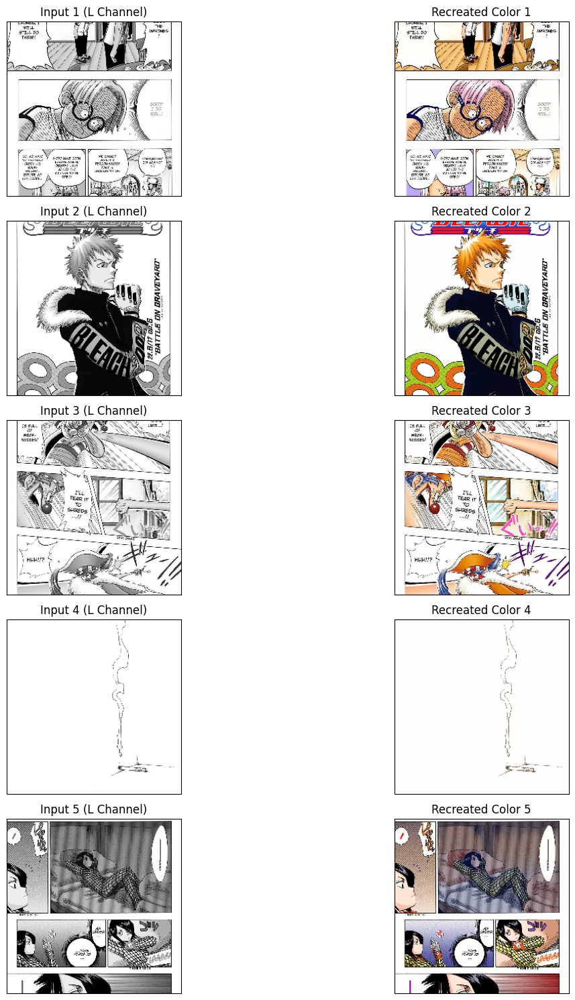

In [ ]:
# --- Set how many images to display from the batch ---
N_IMAGES_TO_SHOW = 5

# 1. Grab one batch from our dataset
#    .take(1) gets one batch. We need 'for' to unpack it.
for L_batch, ab_batch in dataset.take(1):

    print(f"--- Visualizing {N_IMAGES_TO_SHOW} random images ---")

    # 2. Convert the Tensors to NumPy arrays
    L_numpy = L_batch.numpy()
    ab_numpy = ab_batch.numpy()

    # 3. Create the plot
    plt.figure(figsize=(15, N_IMAGES_TO_SHOW * 3))

    # 4. Loop N times to plot N images
    for i in range(N_IMAGES_TO_SHOW):
        # --- Get the i-th image from the batch ---
        L_img = L_numpy[i]
        ab_img = ab_numpy[i]

        # --- Reconstruct the RGB image ---

        # 5. De-normalize L channel: from [-1, 1] back to [0, 100]
        L_de = (L_img + 1.0) * 50.0

        # 6. De-normalize 'ab' channels: from [-1, 1] back to [-128, 127]
        ab_de = ab_img * 128.0

        # 7. Stack L and ab channels to form a Lab image
        #    (H, W, 1) and (H, W, 2) -> (H, W, 3)
        lab_image = np.concatenate([L_de, ab_de], axis=-1)

        # 8. Convert from Lab color space back to RGB
        #    OpenCV expects float32 for this conversion
        rgb_image = cv2.cvtColor(lab_image.astype(np.float32), cv2.COLOR_Lab2RGB)

        # 9. Clip values to [0, 1] for safe plotting with matplotlib
        #    (cv2.cvtColor from float-Lab -> float-RGB in [0, 1] range)
        rgb_image = np.clip(rgb_image, 0.0, 1.0)

        # --- Plot the Input (L) and Output (RGB) ---

        # 10. Plot the Input (L Channel)
        ax = plt.subplot(N_IMAGES_TO_SHOW, 2, i * 2 + 1)
        plt.title(f"Input {i+1} (L Channel)")
        # De-normalize L from [-1, 1] to [0, 1] for grayscale plotting
        L_plot = (L_img + 1.0) / 2.0
        plt.imshow(L_plot.squeeze(), cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # 11. Plot the Recreated Color Image (Ground Truth)
        ax = plt.subplot(N_IMAGES_TO_SHOW, 2, i * 2 + 2)
        plt.title(f"Recreated Color {i+1}")
        plt.imshow(rgb_image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.tight_layout()
    plt.show()

In [ ]:

# Tensorflow Pix2Pix Colorization

#1. Defining the Downsample and upsample blocks (helpers)

def downsample(filters, size, apply_batchnorm = True):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                           kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU(0.2))
  return result


def upsample(filters, size, apply_dropout =False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                    kernel_initializer=initializer, use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())
  return result


In [ ]:
#2. Defining the Generator(U-Net)

def Generator():
  # Input is the L-channel (Grayscale, 1 channel)
  inputs = tf.keras.layers.Input(shape=[IMG_WIDTH, IMG_HEIGHT, 1])

  down_stack = [
      downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128,64)
      downsample(128, 4), # (bs, 64, 64, 128)
      downsample(256, 4), # (bs, 32, 32, 256)
      downsample(512, 4), # (bs, 16, 16, 512)
      downsample(512, 4), # (bs, 8, 8, 512)
      downsample(512,4),  # (bs, 4 , 4, 512)
      downsample(512,4),  # (bs, 2 , 2, 512)
      downsample(512,4),   # (bs, 1, 1, 512)
  ]

  up_stack = [
      upsample(512, 4, apply_dropout = True), #(bs, 2, 2, 1024)
      upsample(512, 4, apply_dropout = True), #(bs, 4, 4, 1024)
      upsample(512, 4, apply_dropout = True), #(bs, 8, 8, 1024)
      upsample(512, 4), #(bs, 16, 16, 1024)
      upsample(256, 4), #(bs, 32, 32, 512)
      upsample(128, 4), #(bs, 64, 64, 256)
      upsample(64, 4),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)

  # Output is the 'ab' channels (2 channels: a* and b*)
  last = layers.Conv2DTranspose(2, 4, strides=2, padding='same',
                                kernel_initializer=initializer, activation='tanh') # (bs, 256, 256, 2)

  x = inputs
  skips = []

  # Downsampling (Encoder)
  for down in down_stack:
    x = down(x)
    skips.append(x)
  skips = reversed(skips[:-1]) # we skip the very last layer(bottleneck)

  # Upsampling (Decoder)

  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs= inputs, outputs = x)


generator = Generator()
generator.summary() # to check the architecture details


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      1,024 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,584 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    525,312 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,099,200 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,196,352 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,196,352 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_5[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 16, 16,    │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_11[0]

 Total params: 54,421,762 (207.60 MB)

 Trainable params: 54,410,882 (207.56 MB)

 Non-trainable params: 10,880 (42.50 KB)

In [ ]:
# 2. Defining the Architecture (PatchGAN Discriminator)

'''The Discriminator checks patches of the image rather than the whole image.
 It takes two inputs: the input (L-channel) and
 the target (true or fake ab-channels).'''


def Discriminator():
  #i/p -1  : L channel (Grayscale, 1 channel)
  input_L = tf.keras.layers.Input(shape = [IMG_WIDTH, IMG_HEIGHT, 1], name = 'input_image_L')
  # i/p-2 : ab-channel (Ground Tuthh or Predicted, 2 Channels)
  target_ab = tf.keras.layers.Input(shape = [IMG_WIDTH, IMG_HEIGHT, 2], name ='target_image_ab')

  # concatenate L and ab channels for discriminator input
  x = tf.keras.layers.concatenate([input_L, target_ab])

  initializer = tf.random_normal_initializer(0., 0.02)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  # The PatchGAN uses a final conv layer instead of flattening/dense layers
  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
  leaky_relu = tf.keras.layers.LeakyReLU(0.2)(batchnorm1)
  dropout = tf.keras.layers.Dropout(0.3)(leaky_relu)
  zero_pad2 = tf.keras.layers.ZeroPadding2D()(dropout) # (bs, 33,33,512)

  #O/P is a single channel probability map (PatchGAN output)
  last = tf.keras.layers.Conv2D(1,4, strides = 1, kernel_initializer=initializer)(zero_pad2)
  #(bs, 30, 30, 1)

  return tf.keras.Model(inputs = [input_L, target_ab], outputs = last)

discriminator = Discriminator()
discriminator.summary()



Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image_L       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ target_image_ab     │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 256, 256,  │          0 │ input_image_L[0]… │
│ (Concatenate)       │ 3)                │            │ target_image_ab[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      3,072 │ concatenate_7[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │    131,584 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │    525,312 │ sequential_16[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 34, 34,    │          0 │ sequential_17[0]… │
│ (ZeroPadding2D)     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 31, 31,    │  2,097,152 │ zero_padding2d[0… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │      2,048 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_11      │ (None, 31, 31,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 31, 31,    │          0 │ leaky_re_lu_11[0… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 33, 33,    │          0 │ dropout_3[0][0]   │
│ (ZeroPadding2D)     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 30, 30, 1) │      8,193 │ zero_padding2d_1… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,767,361 (10.56 MB)

 Trainable params: 2,765,569 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [ ]:
# defining optimizers and losses
#optimizers
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1 = 0.5)

#losses
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)


#Generator Loss (GAN and L1 Loss combination)
def generator_loss(disc_generated_output, gen_output, target_ab):
  # 1. Adversarial Loss (wants to classify fake image as real)
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # 2. L1 Loss (wants the predicted 'ab' to be close to the actual 'ab')
  L1_loss = tf.reduce_mean(tf.abs(target_ab - gen_output))

  # L1 weight (lambda) is typically 100 for Pix2Pix
  lambda_weight = 10 #changed to something lower .... from 100 ## new change ...
  total_gen_loss = gan_loss + (lambda_weight * L1_loss)
  return total_gen_loss, gan_loss, L1_loss

# Discriminator Loss: Real vs. Fake classification
def discriminator_loss(disc_real_output, disc_generated_output):
  # Real loss (wants to classify real images as real = 1)
  real_loss = loss_object(tf.ones_like(disc_real_output)* 0.9, disc_real_output) # updated a bit...

  # Generated loss (wants to classify fake images as fake = 0)
  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss
  return total_disc_loss

In [ ]:
# 5. checkpoint manager
CHECKPOINT_DIR = '/content/drive/MyDrive/Manga_Project_Checkpoints' # ... updated ✅ /content/drive/MyDrive/Manga_Project_Checkpoints
os.makedirs(CHECKPOINT_DIR, exist_ok=True)
checkpoint_prefix = os.path.join(CHECKPOINT_DIR, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# This will load the latest checkpoint if one exists
try:
    checkpoint.restore(tf.train.latest_checkpoint(CHECKPOINT_DIR)).expect_partial()
    print("Resumed training from latest checkpoint!")
except:
    print("Starting training from scratch...")

Resumed training from latest checkpoint!


In [ ]:
#6 : Main Training Step
@tf.function
def train_step(input_L, target_ab):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    # 1. Generator produces predicted 'ab' channels
    gen_output_ab = generator(input_L, training=True)

    # 2. Discriminator runs on Real and Fake pairs
    # Real: Input_L + Target_ab
    disc_real_output = discriminator([input_L, target_ab], training=True)

    # Fake: Input_L + Generated_ab
    disc_generated_output = discriminator([input_L, gen_output_ab], training=True)

    # 3. Calculate Losses
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output_ab, target_ab)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  # 4. Calculate Gradients
  generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  # 5. Apply Gradients
  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

  return gen_total_loss, disc_loss

In [ ]:
#7.Helper Functions for Final training loop

import time
import datetime
#helper fn to convert L, z, b back to RGB for viz(0-255 range)

def display_results(L_input, ab_output, title):
  #denormalize L channel back to 0-255 range
  L_denorm = (L_input[0, :,:,0]+1.0) * 127.5 # shape: [H, W]
  #denormalize ab channels back to the approx ~128 to 127 range then shift to [0, 255]
  ab_denorm = ab_output[0, :, : ,:]* 128.0 + 128.0 # shape: [H, W, 2]
  #concatenate L and ab
  L_denorm = tf.expand_dims(L_denorm, axis =2) # shape : [H, W, 1]
  lab_image = tf.concat([L_denorm, ab_denorm], axis = 2) # Shape: [H, W, 3]
  #convert Lab to RGB (requires numpy/ PIL for this complex conversion) for openCV
  # lab_image_np = lab_image.numpy().astype(np.uint8)

  #severe color distortion solution(?)
  lab_image_np = np.clip(lab_image.numpy(), 0,255).astype(np.uint8)
  # Convert Lab (OpenCV-style) to RGB
  rgb_image_np = cv2.cvtColor(lab_image_np, cv2.COLOR_LAB2RGB)
  plt.figure(figsize=(8, 8))
  plt.title(title)
  plt.imshow(rgb_image_np)
  plt.axis('off')
  plt.show()

def display_ground_truth(color_image_tensor, title):
  #de normalize from [-1,1] to [0,255]
  color_image_uint8 = tf.cast((color_image_tensor[0]+1.0) * 127.5, tf.uint8)
  rgb_image_np = color_image_uint8.numpy()
  plt.figure(figsize = (8,8))
  plt.title(title)
  plt.imshow(rgb_image_np)
  plt.axis('off')
  plt.show()

def display_comparison(L_input, ab_output, color_tensor, title):
  #generated image
  L_denorm = (L_input[0,:,:,0]+1.0) * 127.5
  ab_denorm = ab_output[0,:,:,:]*128.0 + 128.0
  L_denorm = tf.expand_dims(L_denorm, axis =2)
  lab_fake = tf.concat([L_denorm, ab_denorm], axis = 2)
  lab_fake_np = np.clip(lab_fake.numpy(), 0,255).astype(np.uint8)
  rgb_fake = cv2.cvtColor(lab_fake_np, cv2.COLOR_LAB2RGB)

  #ground truth image
  rgb_true = tf.cast((color_tensor[0]+1.0) * 127.5, tf.uint8).numpy()

  #plotting both of them side by side
  plt.figure(figsize = (12,6))
  plt.suptitle(title, fontsize = 16)

  plt.subplot(1,2,1)
  plt.title("Generated (Fake)")
  plt.imshow(rgb_fake)
  plt.axis('off')

  plt.subplot(1,2,2)
  plt.title("Ground Truth")
  plt.imshow(rgb_true)
  plt.axis('off')

  plt.tight_layout()
  plt.show()




Restored from ckpt_epoch20-2
Epoch 21 Step 0 | G Loss: 1.8153 | D Loss: 0.9918
Epoch 21 Step 500 | G Loss: 2.2574 | D Loss: 1.0302

--- Epoch 21 completed ---
Time taken for epoch 21: 681.93 sec
Average G Loss: 2.1247 | Average D Loss: 1.0787


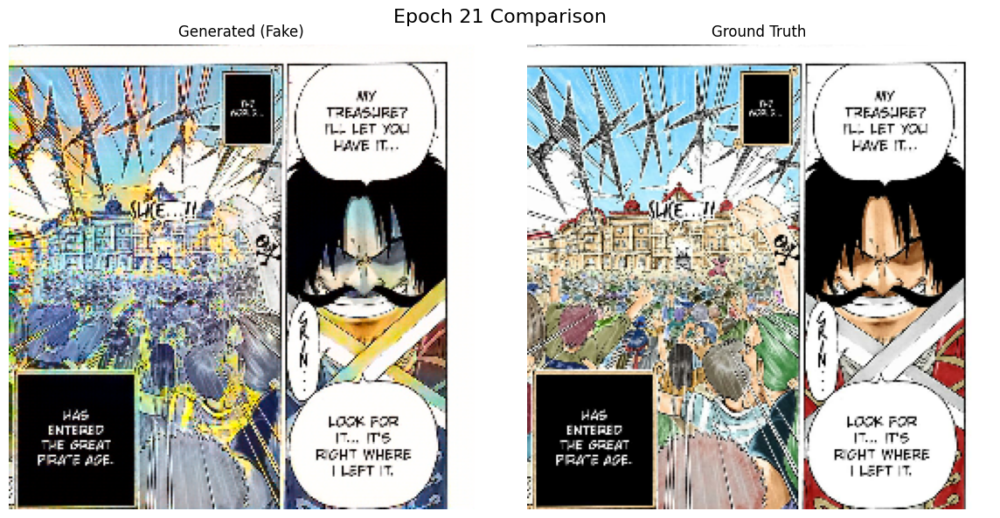

Epoch 22 Step 0 | G Loss: 2.2943 | D Loss: 1.0510
Epoch 22 Step 500 | G Loss: 2.3750 | D Loss: 0.7586

--- Epoch 22 completed ---
Time taken for epoch 22: 608.88 sec
Average G Loss: 2.1434 | Average D Loss: 1.0810


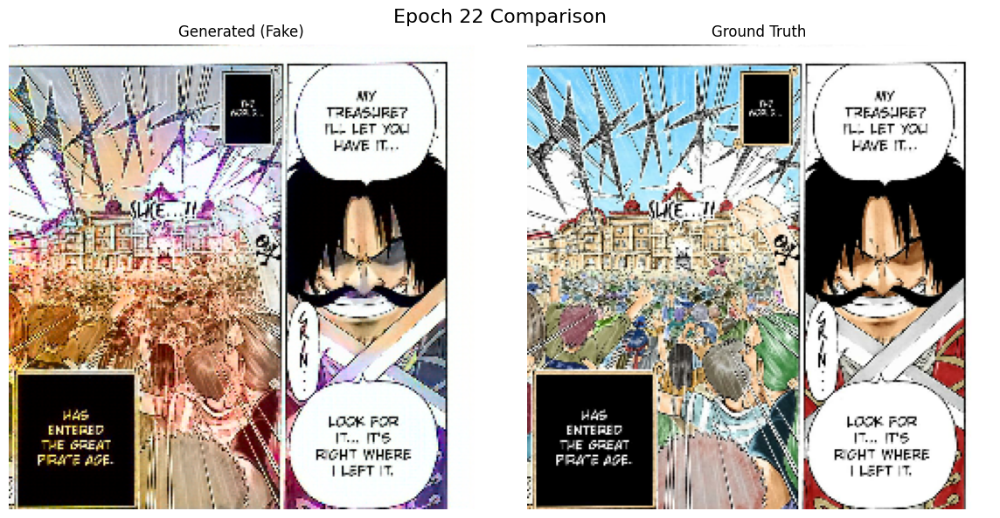

Epoch 23 Step 0 | G Loss: 2.3493 | D Loss: 0.7193
Epoch 23 Step 500 | G Loss: 2.0299 | D Loss: 0.9044

--- Epoch 23 completed ---
Time taken for epoch 23: 608.19 sec
Average G Loss: 2.1716 | Average D Loss: 1.0776


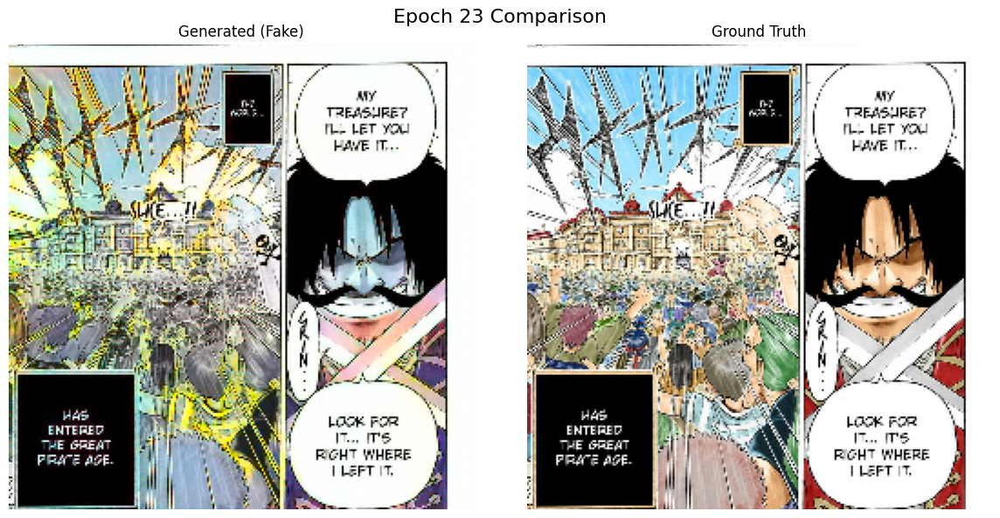

Epoch 24 Step 0 | G Loss: 1.4402 | D Loss: 1.2289
Epoch 24 Step 500 | G Loss: 2.3616 | D Loss: 0.8468

--- Epoch 24 completed ---
Time taken for epoch 24: 612.45 sec
Average G Loss: 2.1743 | Average D Loss: 1.0720


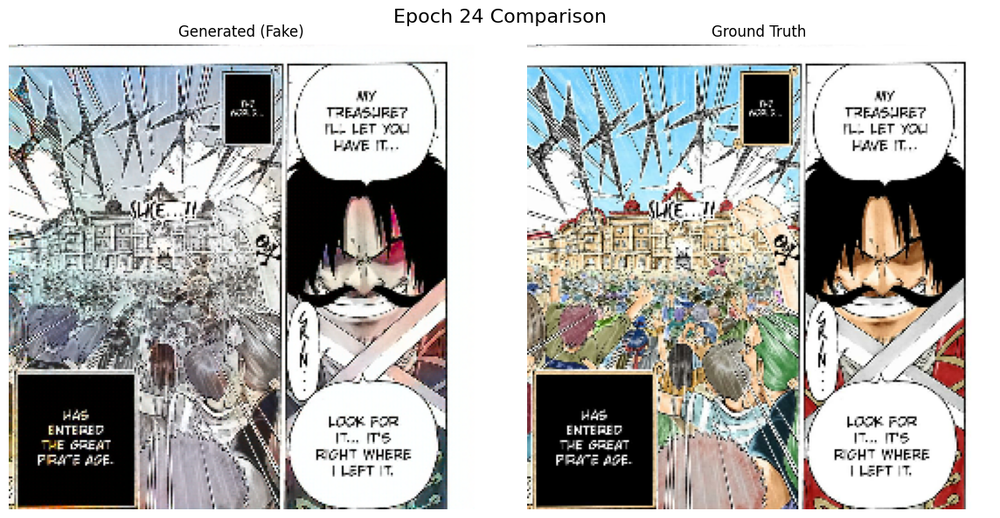

Epoch 25 Step 0 | G Loss: 1.8779 | D Loss: 1.1226
Epoch 25 Step 500 | G Loss: 2.0000 | D Loss: 1.0448

--- Epoch 25 completed ---
Time taken for epoch 25: 609.49 sec
Average G Loss: 2.1694 | Average D Loss: 1.0773


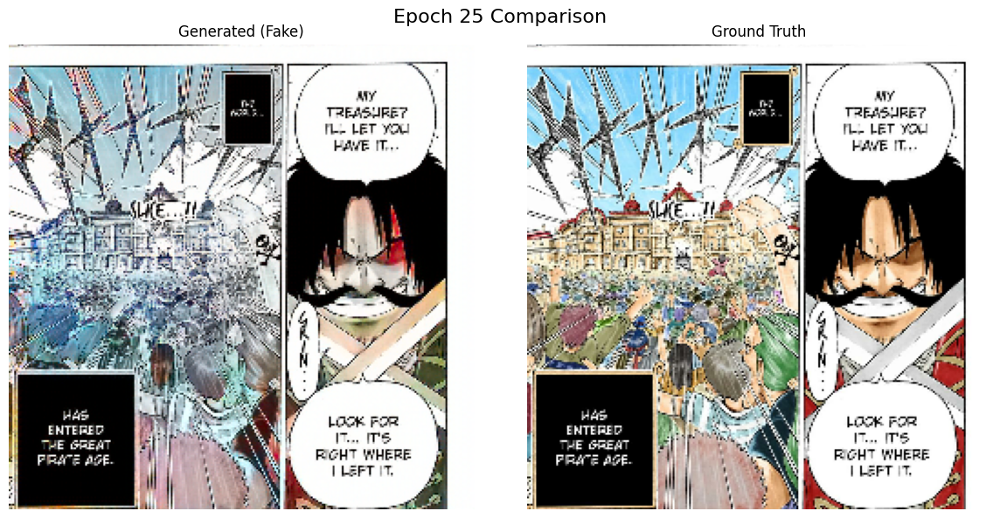

Epoch 26 Step 0 | G Loss: 1.9917 | D Loss: 1.2008
Epoch 26 Step 500 | G Loss: 1.7720 | D Loss: 1.1418

--- Epoch 26 completed ---
Time taken for epoch 26: 608.26 sec
Average G Loss: 2.1780 | Average D Loss: 1.0715


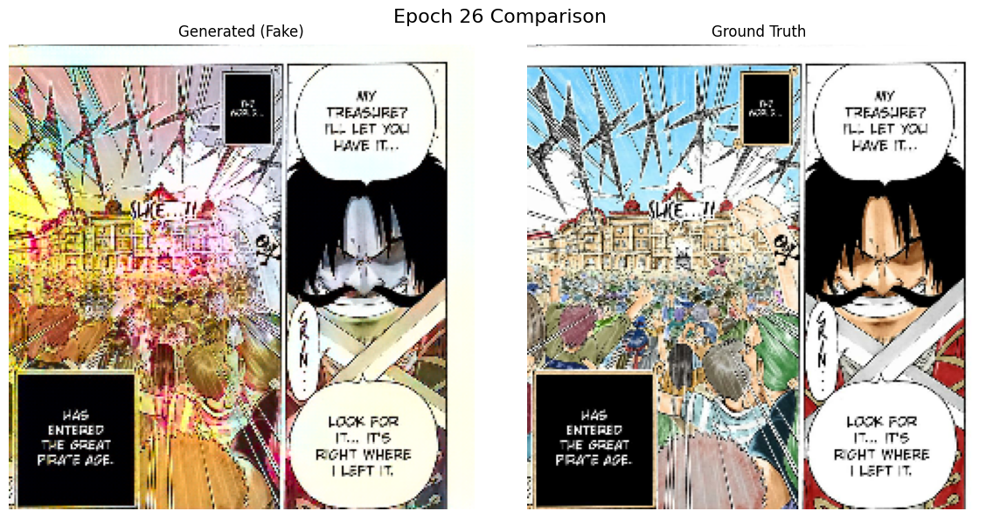

Epoch 27 Step 0 | G Loss: 2.6512 | D Loss: 0.9610
Epoch 27 Step 500 | G Loss: 2.4536 | D Loss: 0.8211

--- Epoch 27 completed ---
Time taken for epoch 27: 610.26 sec
Average G Loss: 2.1754 | Average D Loss: 1.0735


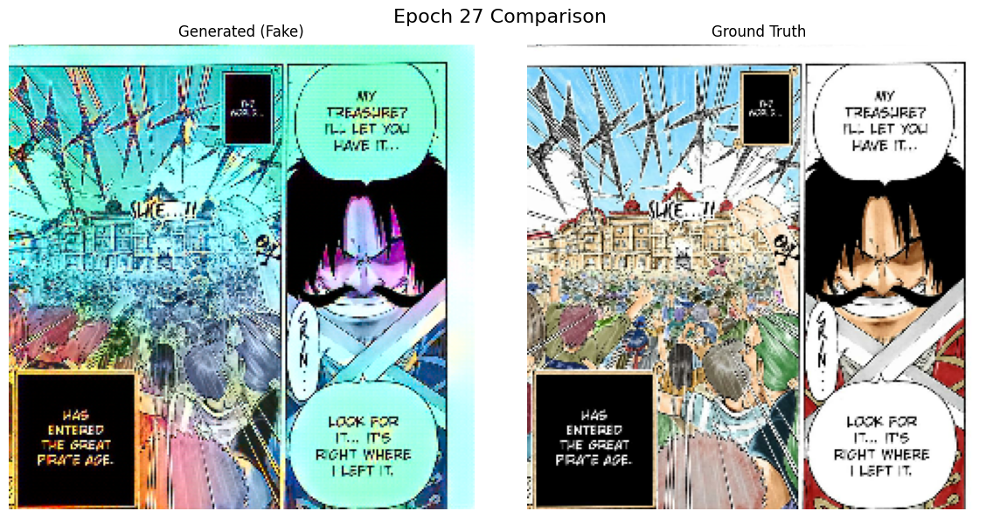

Epoch 28 Step 0 | G Loss: 1.4979 | D Loss: 1.3312
Epoch 28 Step 500 | G Loss: 2.2139 | D Loss: 0.8673

--- Epoch 28 completed ---
Time taken for epoch 28: 609.49 sec
Average G Loss: 2.1834 | Average D Loss: 1.0710


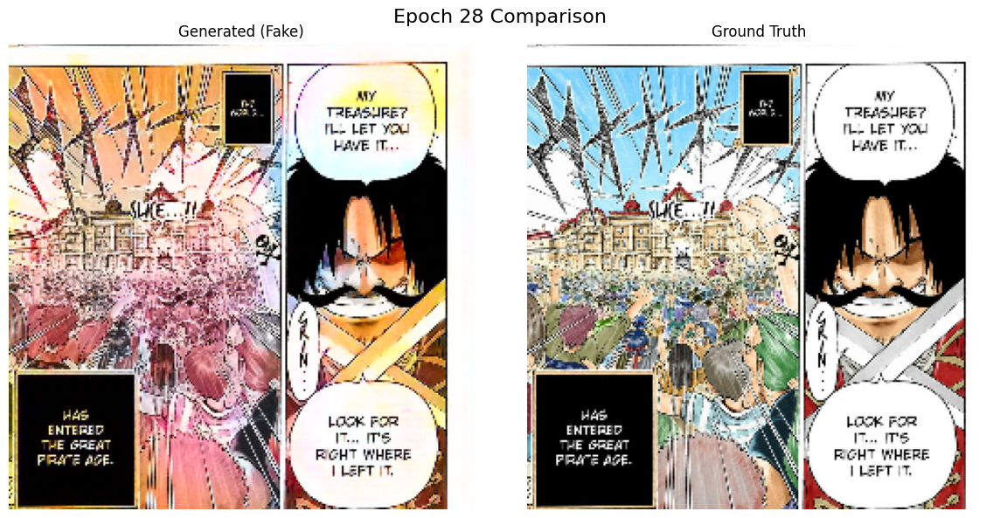

Epoch 29 Step 0 | G Loss: 1.9575 | D Loss: 0.9689
Epoch 29 Step 500 | G Loss: 1.9731 | D Loss: 0.9651

--- Epoch 29 completed ---
Time taken for epoch 29: 609.55 sec
Average G Loss: 2.1626 | Average D Loss: 1.0817


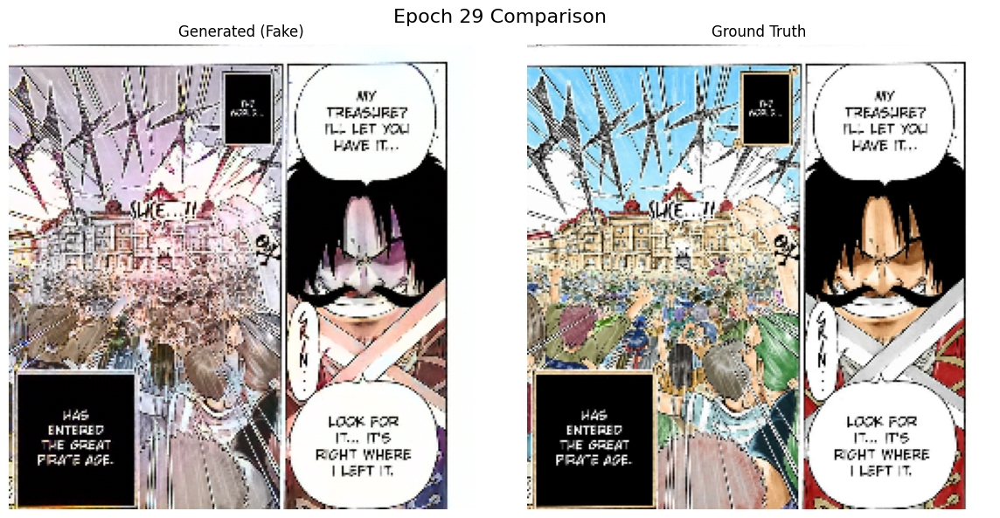

Epoch 30 Step 0 | G Loss: 2.4165 | D Loss: 1.1163
Epoch 30 Step 500 | G Loss: 2.3441 | D Loss: 0.7829

--- Epoch 30 completed ---
Time taken for epoch 30: 610.57 sec
Average G Loss: 2.1800 | Average D Loss: 1.0753
Checkpoint saved to Google Drive.


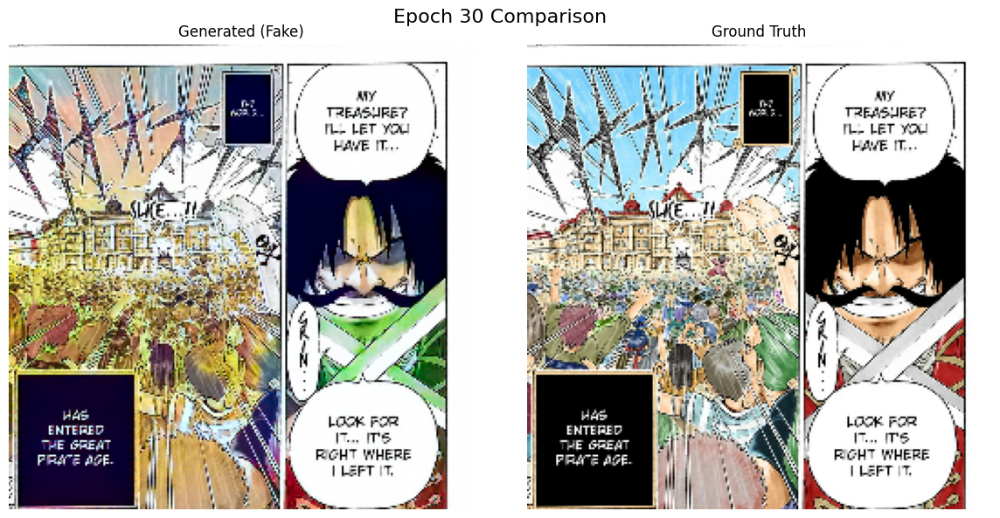

In [ ]:
#Final Training Loop

EPOCHS = 30 # Target for initial coursework result
log_freq = 500 # Log progress every N steps
# start_epoch = int(checkpoint.save_counter.numpy()) if tf.train.latest_checkpoint(CHECKPOINT_DIR) else 0
# Restore from specific checkpoint
checkpoint_path = os.path.join(CHECKPOINT_DIR, 'ckpt_epoch20-2')
checkpoint.restore(checkpoint_path).expect_partial()
print("Restored from ckpt_epoch20-2")

# Manually set start_epoch
start_epoch = 20  # Based on the checkpoint name
for epoch in range(start_epoch, EPOCHS):
  start = time.time()

  gen_total_loss_sum = 0
  disc_loss_sum = 0
  step = 0

  for L_input, ab_target in dataset:
    gen_loss, disc_loss = train_step(L_input, ab_target)
    gen_total_loss_sum += gen_loss
    disc_loss_sum += disc_loss

    if step % log_freq == 0:
      print (f'Epoch {epoch+1} Step {step} | G Loss: {gen_loss.numpy():.4f} | D Loss: {disc_loss.numpy():.4f}')

    step += 1

  avg_gen_loss = gen_total_loss_sum / step
  avg_disc_loss = disc_loss_sum / step

  print(f'\n--- Epoch {epoch+1} completed ---')
  print(f'Time taken for epoch {epoch+1}: {time.time()-start:.2f} sec')
  print(f'Average G Loss: {avg_gen_loss.numpy():.4f} | Average D Loss: {avg_disc_loss.numpy():.4f}')

  # Save the model every 10 epochs for persistence
  if (epoch + 1) % 10 == 0:
    checkpoint.save(file_prefix=f"{checkpoint_prefix}_epoch{epoch+1}")
    print("Checkpoint saved to Google Drive.")

  # Display a sample result every epoch
  if (epoch + 1) % 1 == 0:
    for (bw_path, color_path) in tf.data.Dataset.from_tensor_slices((bw_images, color_images)).take(1):
      # Load and preprocess the original color image
      L_input, color_tensor = load_and_resize_and_normalize(bw_path.numpy().decode(), color_path.numpy().decode())
      gen_output = generator(tf.expand_dims(L_input[:, :, 0:1], axis=0), training=False)

      display_comparison(tf.expand_dims(L_input[:, :, 0:1], axis=0), gen_output, tf.expand_dims(color_tensor, axis=0), f"Epoch {epoch+1} Comparison")


